**Data Analysis on the distribution of Gleason scores (sample types) with respect to data provider**

## Prostate cancer diagnosis using the Gleason grading system ##

### Problem ###

The goal of this project is to identify the severity of the prostate cancer for given a biopsy image. 

The severity of cancer in a small patch of cancerous tissue is defined by the Gleason  Score. Though, the overall tissue sample might have multiple cancerous regions with different Gleason Scores. Thus, the severity of the cancer for the whole sample is graded differently (by ISUP Grades) as shown below.

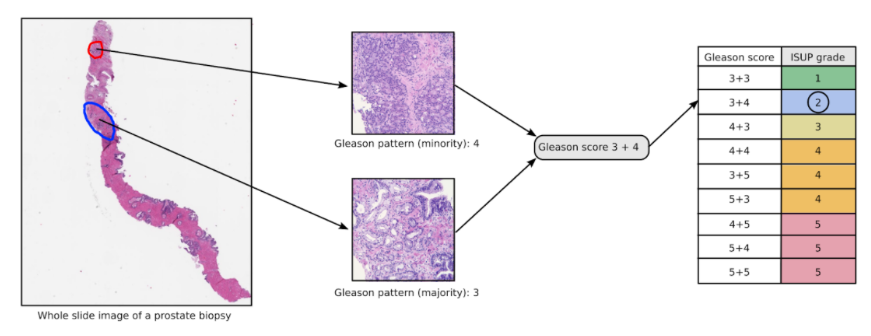

Cancerous cells have the following visual differences compared to a healthy cell:
*     Darker cytoplasm
*     Larger nuclei
*     Less number of hollow locations (glands)

In [1]:
import os
import skimage.io

import pandas as pd
import numpy as np
import matplotlib
import matplotlib.pyplot as plt
import PIL
from IPython.display import Image, display
import plotly.graph_objs as go

import zipfile
import time
import seaborn as sb
from tqdm import tqdm

In [2]:
kaggle_data= '/data/users/rpravahan/panda'

data_dir=kaggle_data+'/train_images'
label_dir=kaggle_data+'/train.csv'
train_labels = pd.read_csv(label_dir).set_index('image_id')

**Let us do a quality check on the dataset labels**

In [3]:
labels= pd.read_csv(label_dir)
labels.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10616 entries, 0 to 10615
Data columns (total 4 columns):
 #   Column         Non-Null Count  Dtype 
---  ------         --------------  ----- 
 0   image_id       10616 non-null  object
 1   data_provider  10616 non-null  object
 2   isup_grade     10616 non-null  int64 
 3   gleason_score  10616 non-null  object
dtypes: int64(1), object(3)
memory usage: 331.9+ KB


* No NA content in the dataset labels with ~11k data

In [4]:
labels

,image_id,data_provider,isup_grade,gleason_score
0,0005f7aaab2800f6170c399693a96917,karolinska,0,0+0
1,000920ad0b612851f8e01bcc880d9b3d,karolinska,0,0+0
2,0018ae58b01bdadc8e347995b69f99aa,radboud,4,4+4
3,001c62abd11fa4b57bf7a6c603a11bb9,karolinska,4,4+4
4,001d865e65ef5d2579c190a0e0350d8f,karolinska,0,0+0
...,...,...,...,...
10611,ffd2841373b39792ab0c84cccd066e31,radboud,0,negative
10612,ffdc59cd580a1468eac0e6a32dd1ff2d,radboud,5,4+5
10613,ffe06afd66a93258f8fabdef6044e181,radboud,0,negative
10614,ffe236a25d4cbed59438220799920749,radboud,2,3+4


**Data is provided by 2 groups with same number of samples but the distribution of the number of samples are slightly imbalanced.**

In [5]:
labels.groupby("data_provider").count()["isup_grade"]

data_provider
karolinska    5456
radboud       5160
Name: isup_grade, dtype: int64

In [6]:
labels.groupby("gleason_score").count()["isup_grade"]

gleason_score
0+0         1925
3+3         2666
3+4         1342
3+5           80
4+3         1243
4+4         1126
4+5          849
5+3           43
5+4          248
5+5          127
negative     967
Name: isup_grade, dtype: int64

In [7]:
labels.groupby("isup_grade").count()["image_id"]

isup_grade
0    2892
1    2666
2    1343
3    1242
4    1249
5    1224
Name: image_id, dtype: int64

In [8]:
rad= labels.loc[labels["data_provider"]=="radboud"].copy()
kar= labels.loc[labels["data_provider"]=="karolinska"].copy()

In [9]:
rad_isup=rad.groupby("isup_grade").count()["image_id"]
kar_isup=kar.groupby("isup_grade").count()["image_id"]
isups= pd.concat([rad_isup,kar_isup],axis=1)
isups.columns =["rad","kar"]
isups

,rad,kar
isup_grade,,
0,967,1925
1,852,1814
2,675,668
3,925,317
4,768,481
5,973,251


In [10]:
rad_g=rad.groupby("gleason_score").count()["image_id"]
kar_g=kar.groupby("gleason_score").count()["image_id"]
ig= pd.DataFrame({'ISUP':[1,2,3,4,4,4,5,5,5,0,0]},
                 index=['3+3','3+4','4+3','4+4','3+5','5+3','4+5','5+4','5+5','negative','0+0'])

gleason= pd.concat([rad_g,kar_g,ig],axis=1)
gleason.columns =["rad","kar","ISUP"]
gleason_sorted=gleason.sort_values(by=["ISUP"],axis=0)
gleason_sorted

,rad,kar,ISUP
negative,967.0,NaN,0
0+0,NaN,1925.0,0
3+3,852.0,1814.0,1
3+4,675.0,667.0,2
4+3,925.0,318.0,3
3+5,67.0,13.0,4
4+4,660.0,466.0,4
5+3,41.0,2.0,4
4+5,641.0,208.0,5
5+4,221.0,27.0,5


* Karolinksa doesn't have that many samples with cancer whereas Radbound's data is relatively balanced.
* Notation for healthy samples are different(negative vs 0+0)

**Get sample image IDs for different Gleason Scores**

Let us have a look at what kind of images we are going to deal with for different Gleason Scores

In [11]:
labels.loc[labels["image_id"]=="005e66f06bce9c2e49142536caf2f6ee"]


,image_id,data_provider,isup_grade,gleason_score
14,005e66f06bce9c2e49142536caf2f6ee,karolinska,1,3+3


In [12]:
rad_im_ID={}
GS_list= gleason.index.values
for gscore in GS_list:
    if (gscore=="0+0"): continue        
    rad_GS = rad.loc[rad["gleason_score"]==gscore]["image_id"]
    img_num= rad_GS.sample(n=1, replace=False, random_state=None).values
    rad_im_ID[gscore]=img_num[0]
    print(gscore," : ",img_num)

3+3  :  ['c03d33fab2892def02106da2f342fa23']
3+4  :  ['53f9f8b1c02567febb3209a7671117c1']
3+5  :  ['0d3159cd1b2495cc82637ececf63ed41']
4+3  :  ['268dcbd78318c0108974c5f99e1dca78']
4+4  :  ['6b10e2f8cd5d3add0fd7f2f932e86fa5']
4+5  :  ['adb6453b3935267a4d77a60fd75d807d']
5+3  :  ['146fdf9cb391b6199413967a26ee3305']
5+4  :  ['ad52bc1015f33bb777ea49504f87988a']
5+5  :  ['f2196dcfec3027846cdd304448f28fa5']
negative  :  ['d9652aa1aed6ef06e2c1f8181b734d9e']


In [13]:
kar_im_ID={}
for gscore in GS_list:
    if (gscore=="negative"): continue        
    kar_GS = kar.loc[kar["gleason_score"]==gscore]["image_id"]
    img_num= kar_GS.sample(n=1, replace=False, random_state=None).values
    kar_im_ID[gscore]=img_num[0]
    print(gscore," : ",img_num)

3+3  :  ['36909d9bacf3828022000e94bc4d02c5']
3+4  :  ['4ef1c36d1a970ae4f2aeb47b14190afe']
3+5  :  ['75b0ca283a903e85a9e7edd122435bf9']
4+3  :  ['e8305f87e3ba6f187920804740068790']
4+4  :  ['b0aca7fed1a87d29f3be153d3b8c49f5']
4+5  :  ['ec5c3e40db39e2e12c39b76f9d5e1ec2']
5+3  :  ['aae503ac1b8aa0f17fc7ebff97c047df']
5+4  :  ['d8442dd9a38b2f244a020c1b39107751']
5+5  :  ['f28915d34c10051b4a91d30d2cbca62c']
0+0  :  ['45abd719007c004e8b172a18bac7d2d1']


In [14]:
def sk_img(img_path, level=None, verbose=True):
    image = skimage.io.MultiImage(str(img_path))
    for i,layer in enumerate(image):
        if verbose:
            print(f"Biopsy level {i} dimensions: {layer.shape}")
            print(f"Biopsy level {i} memory size: {layer.nbytes / 1024**2:.1f}mb")
        
        pil_img=PIL.Image.fromarray(image[level])
        return pil_img,layer.shape[1],layer.shape[0]

def large_display(im_ID_dic, data_dir=data_dir, level=2):
    for k in im_ID_dic.keys():
        print('Gleason Score: ',k,'im_ID: ',im_ID_dic[k])
        image_num= im_ID_dic[k]
        img_path=os.path.join(data_dir, image_num+'.tiff')
        whole,width,height = sk_img(img_path, level=2,verbose=True)
        display(whole)

Following are samples from different providers:

    - From ISUP score 0 to 5 : porous nature of the glands are lost
    - Coloring and shapes of the samples significantly differ between providers
    - There are very large empty patches in the Karolinska images

Gleason Score:  3+3 im_ID:  c03d33fab2892def02106da2f342fa23
Biopsy level 0 dimensions: (30464, 8960, 3)
Biopsy level 0 memory size: 780.9mb


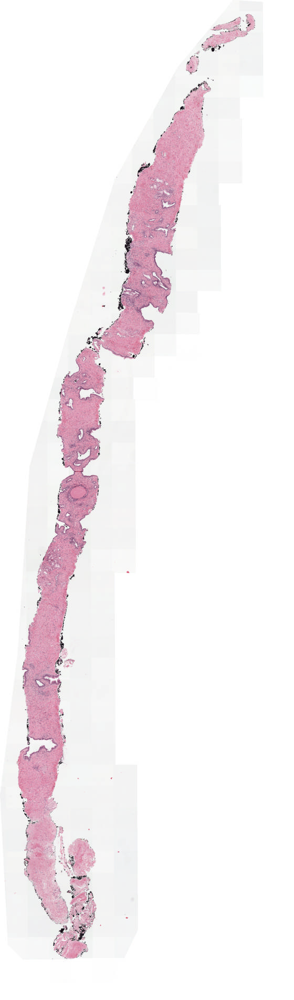

Gleason Score:  3+4 im_ID:  53f9f8b1c02567febb3209a7671117c1
Biopsy level 0 dimensions: (19968, 12800, 3)
Biopsy level 0 memory size: 731.2mb


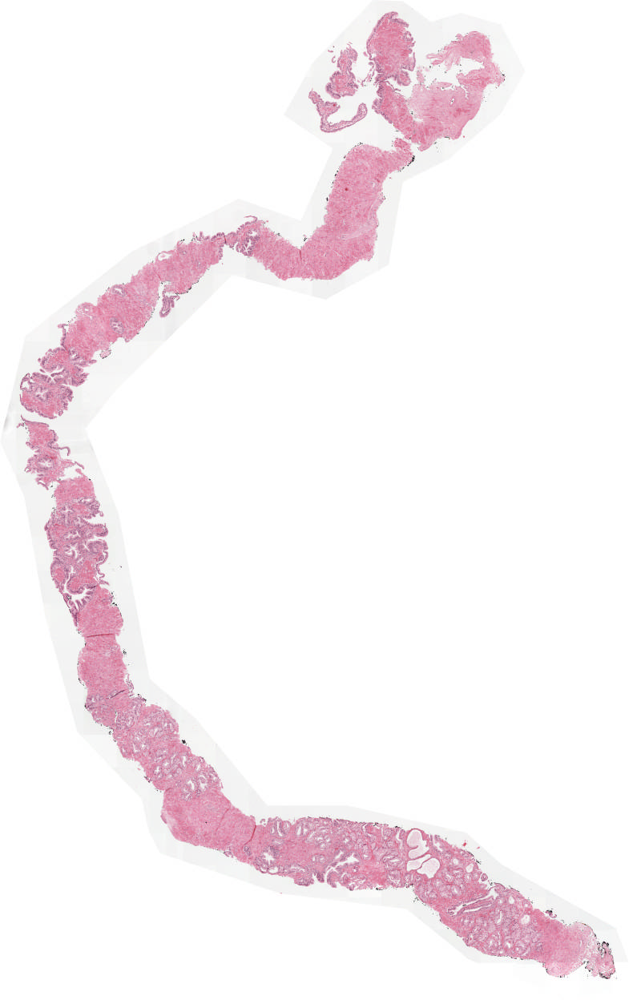

Gleason Score:  3+5 im_ID:  0d3159cd1b2495cc82637ececf63ed41
Biopsy level 0 dimensions: (9728, 20992, 3)
Biopsy level 0 memory size: 584.2mb


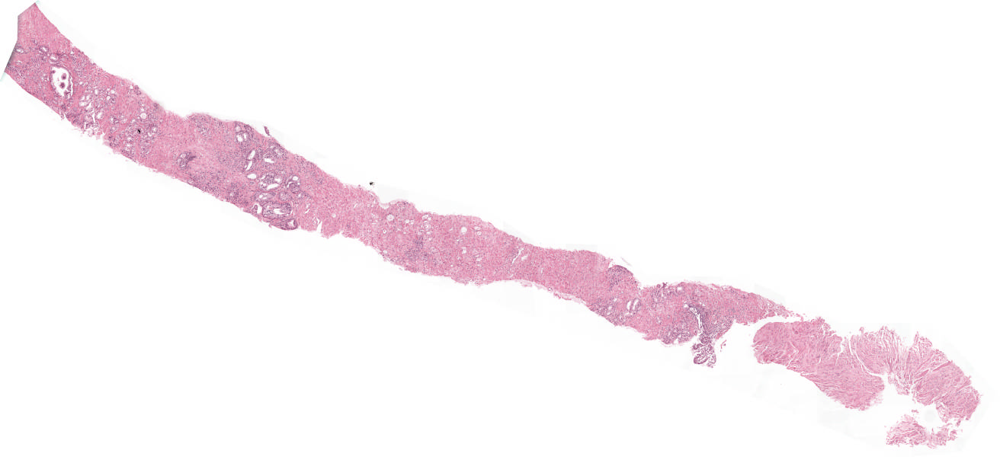

Gleason Score:  4+3 im_ID:  268dcbd78318c0108974c5f99e1dca78
Biopsy level 0 dimensions: (28416, 12288, 3)
Biopsy level 0 memory size: 999.0mb


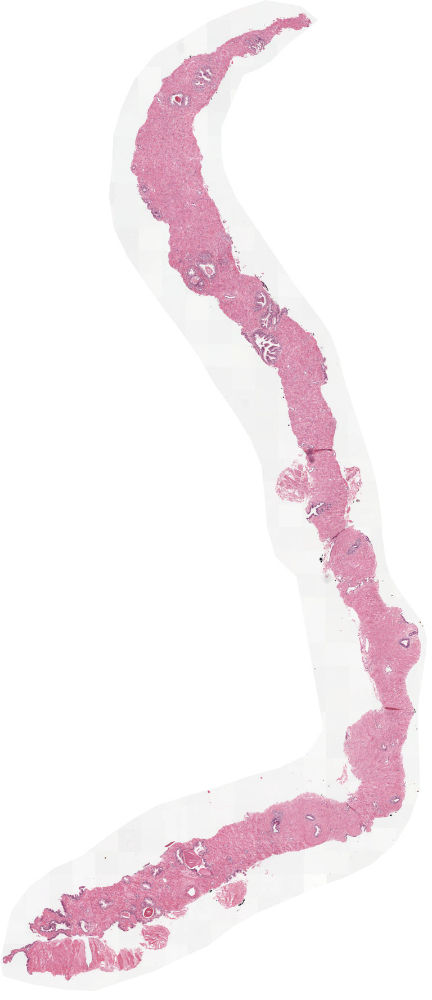

Gleason Score:  4+4 im_ID:  6b10e2f8cd5d3add0fd7f2f932e86fa5
Biopsy level 0 dimensions: (8960, 3840, 3)
Biopsy level 0 memory size: 98.4mb


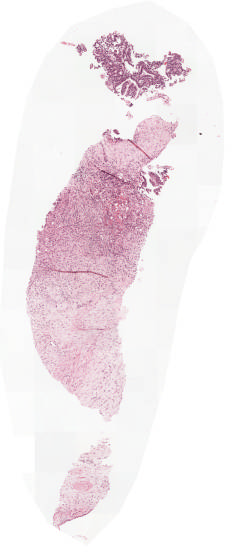

Gleason Score:  4+5 im_ID:  adb6453b3935267a4d77a60fd75d807d
Biopsy level 0 dimensions: (7680, 12544, 3)
Biopsy level 0 memory size: 275.6mb


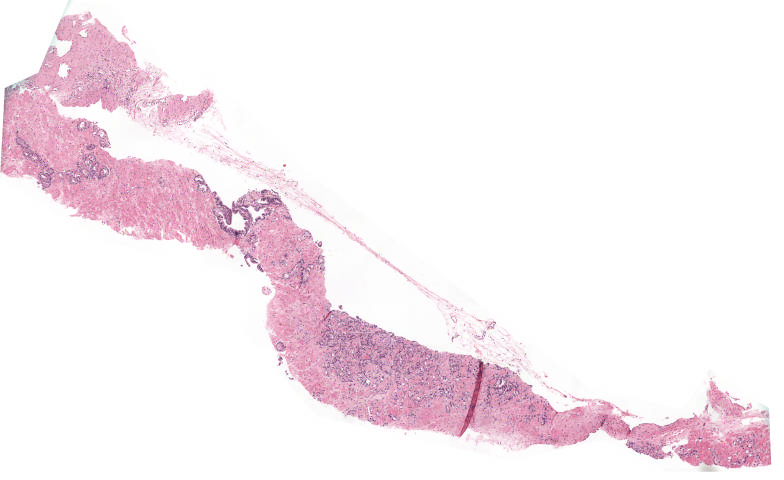

Gleason Score:  5+3 im_ID:  146fdf9cb391b6199413967a26ee3305
Biopsy level 0 dimensions: (34560, 11520, 3)
Biopsy level 0 memory size: 1139.1mb


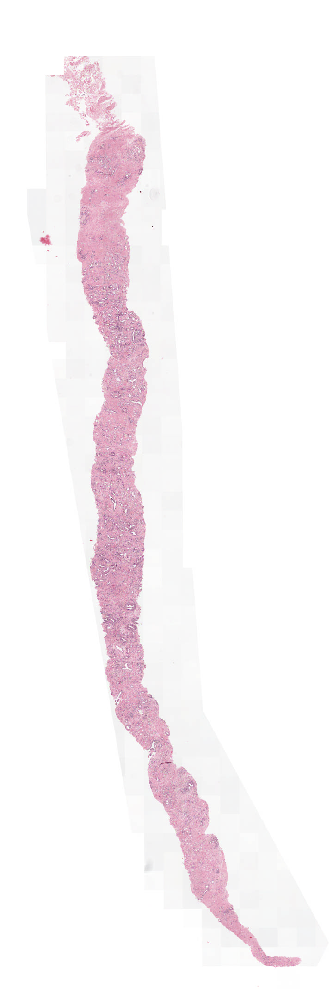

Gleason Score:  5+4 im_ID:  ad52bc1015f33bb777ea49504f87988a
Biopsy level 0 dimensions: (6656, 18944, 3)
Biopsy level 0 memory size: 360.8mb


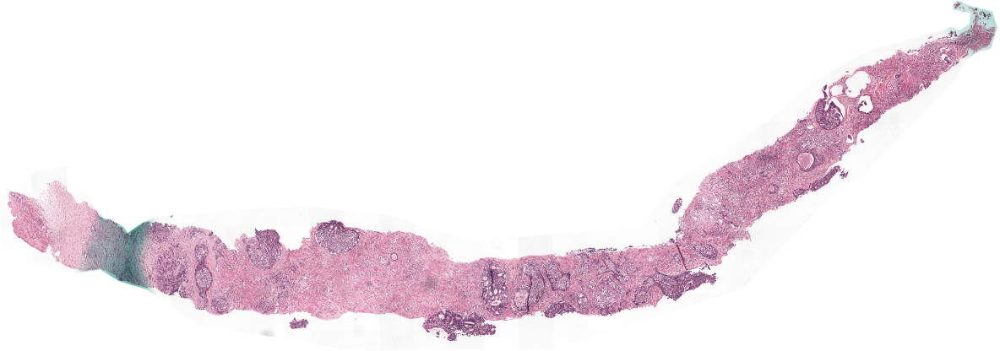

Gleason Score:  5+5 im_ID:  f2196dcfec3027846cdd304448f28fa5
Biopsy level 0 dimensions: (24832, 7936, 3)
Biopsy level 0 memory size: 563.8mb


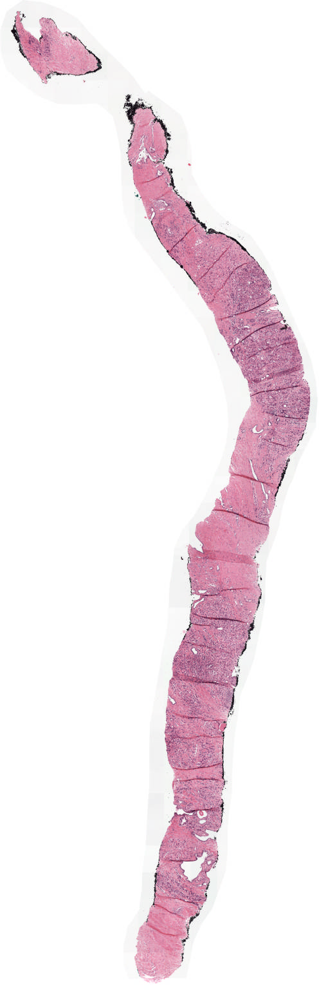

Gleason Score:  negative im_ID:  d9652aa1aed6ef06e2c1f8181b734d9e
Biopsy level 0 dimensions: (9728, 7680, 3)
Biopsy level 0 memory size: 213.8mb


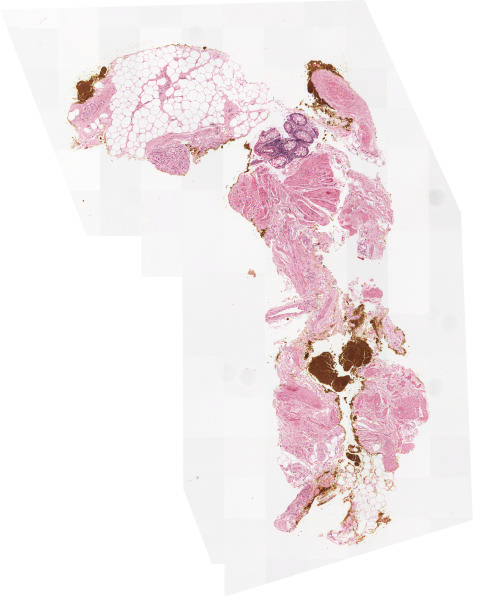

In [15]:
# Sample Images from Radboud Institute
large_display(rad_im_ID)


Gleason Score:  3+3 im_ID:  36909d9bacf3828022000e94bc4d02c5
Biopsy level 0 dimensions: (30517, 24900, 3)
Biopsy level 0 memory size: 2174.0mb


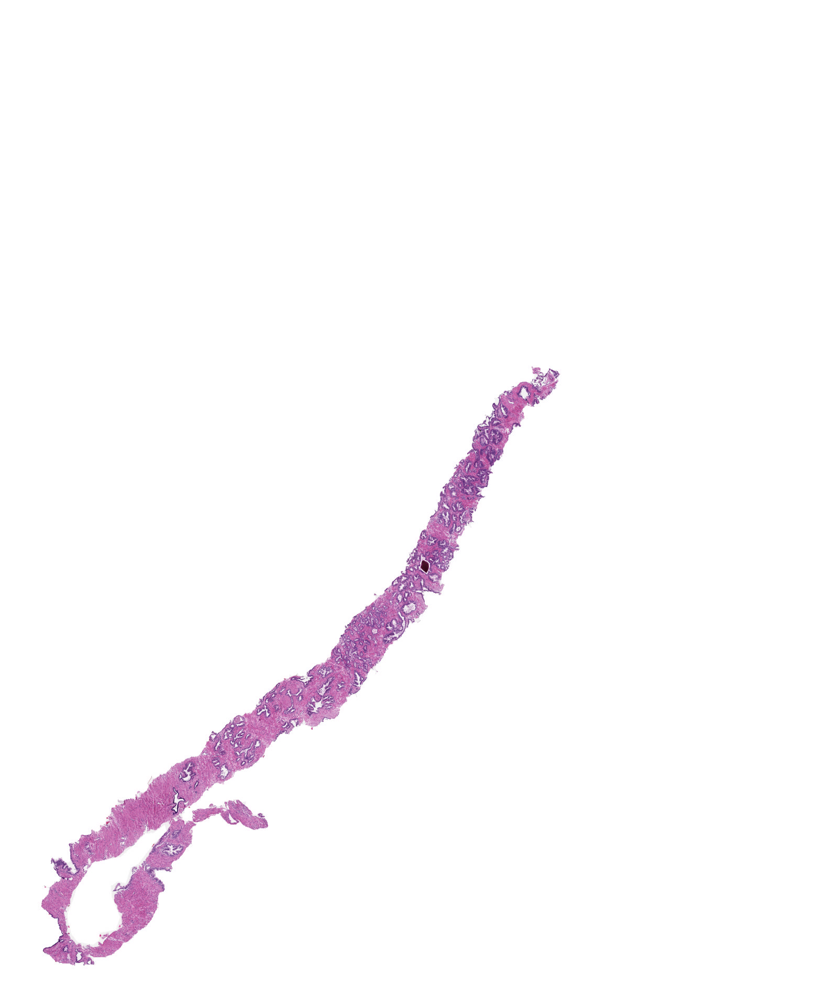

Gleason Score:  3+4 im_ID:  4ef1c36d1a970ae4f2aeb47b14190afe
Biopsy level 0 dimensions: (28416, 25600, 3)
Biopsy level 0 memory size: 2081.2mb


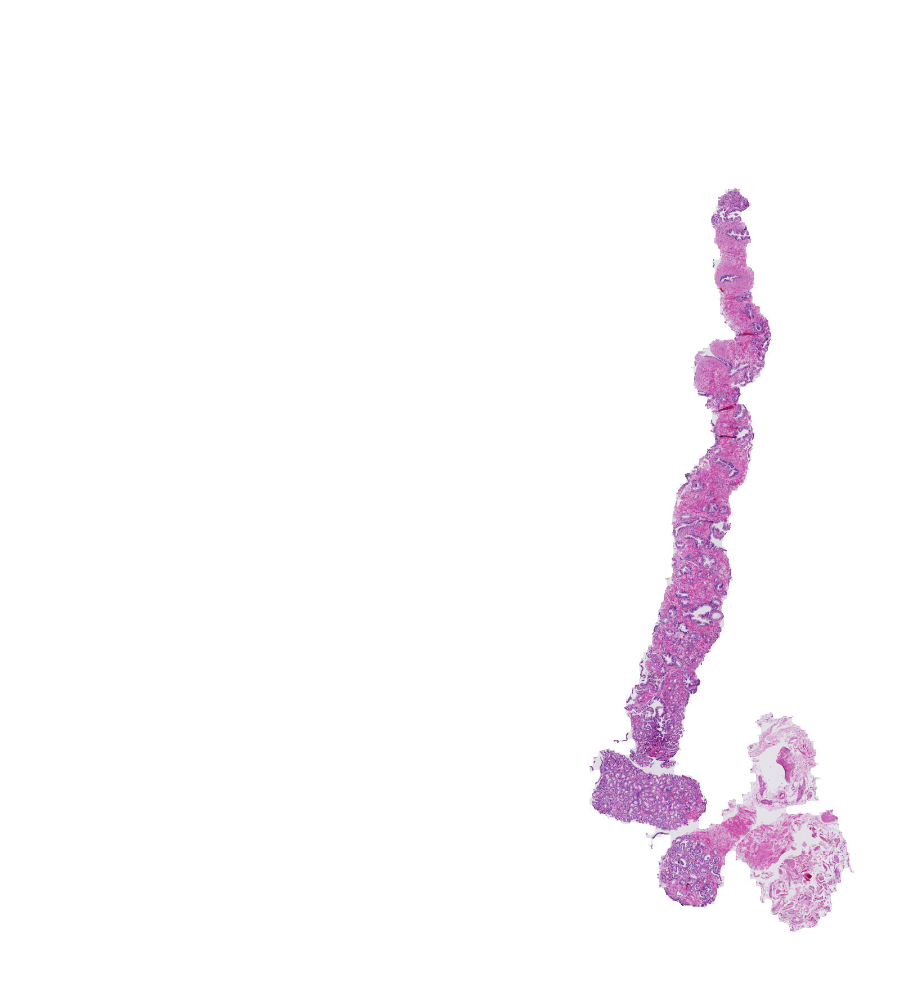

Gleason Score:  3+5 im_ID:  75b0ca283a903e85a9e7edd122435bf9
Biopsy level 0 dimensions: (20480, 16384, 3)
Biopsy level 0 memory size: 960.0mb


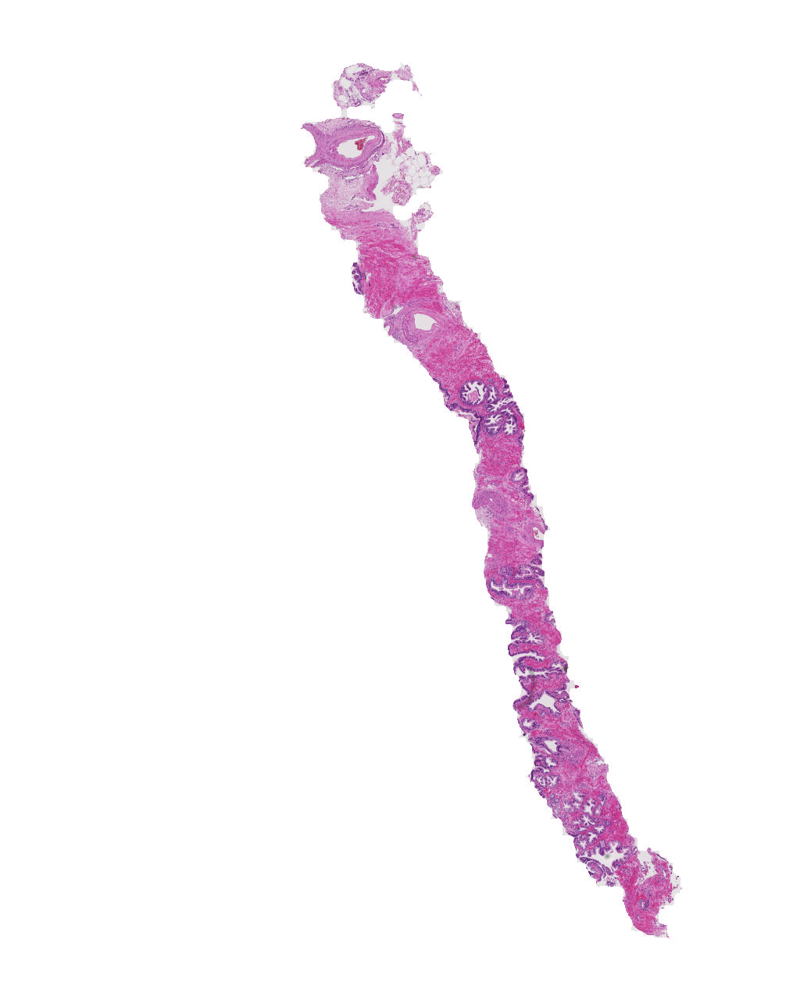

Gleason Score:  4+3 im_ID:  e8305f87e3ba6f187920804740068790
Biopsy level 0 dimensions: (26488, 26891, 3)
Biopsy level 0 memory size: 2037.9mb


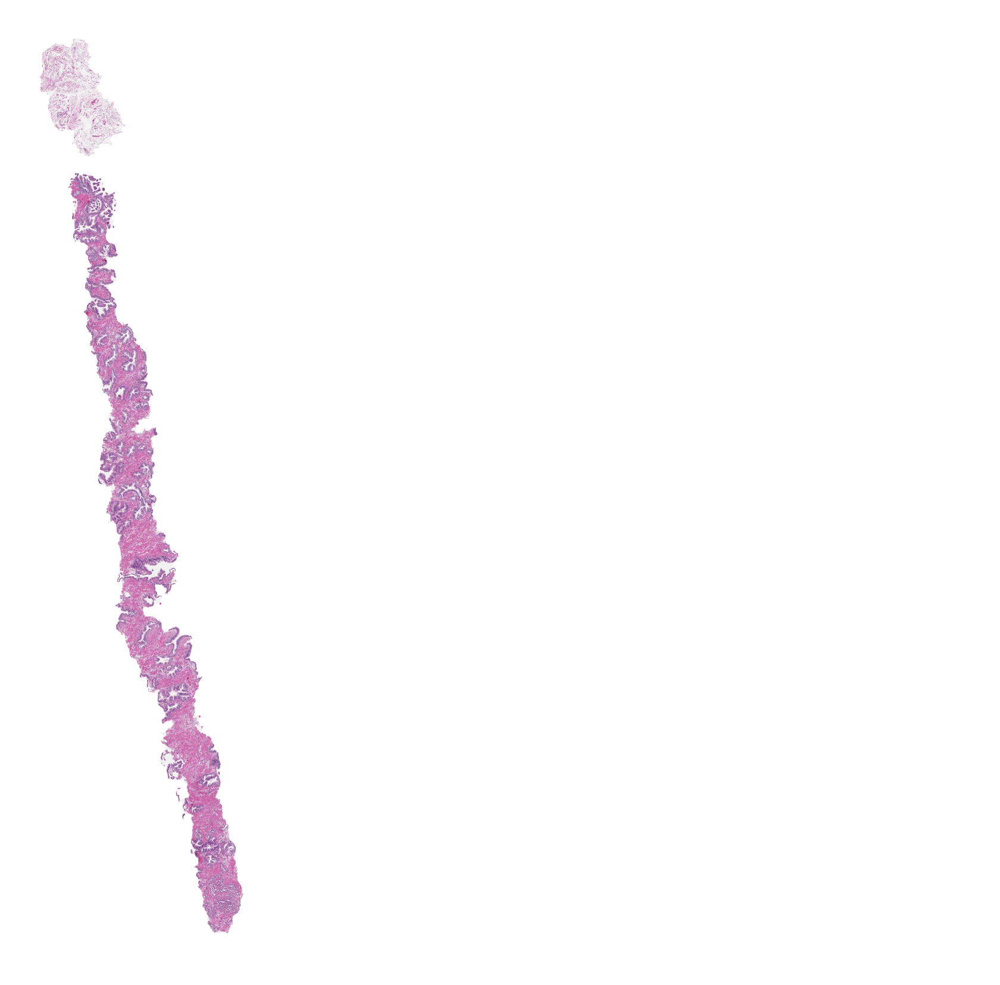

Gleason Score:  4+4 im_ID:  b0aca7fed1a87d29f3be153d3b8c49f5
Biopsy level 0 dimensions: (31000, 21912, 3)
Biopsy level 0 memory size: 1943.4mb


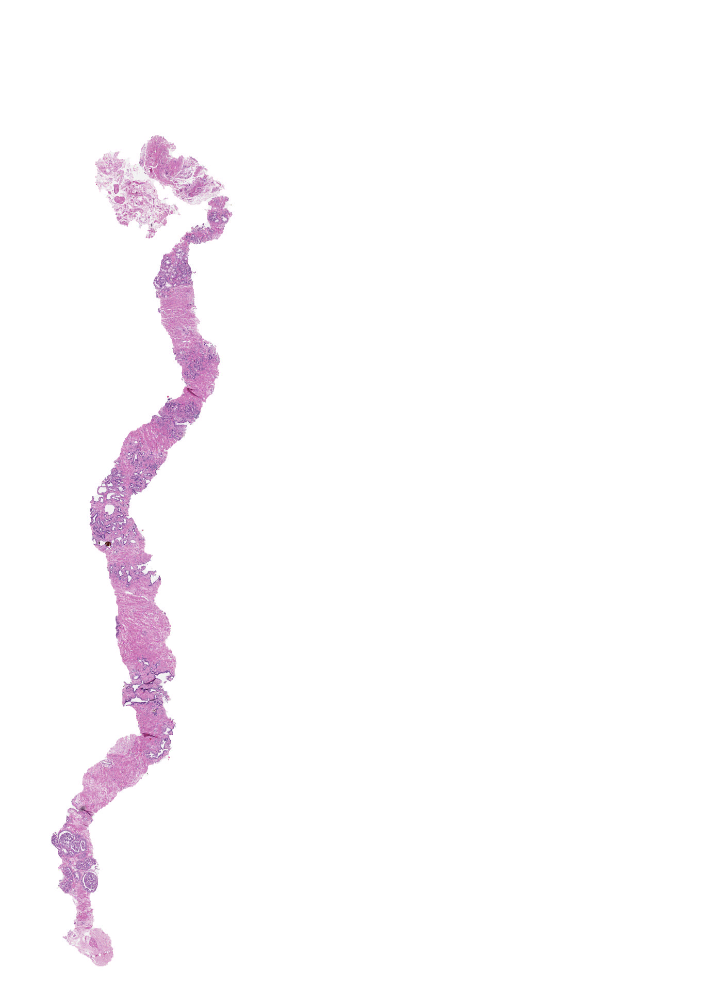

Gleason Score:  4+5 im_ID:  ec5c3e40db39e2e12c39b76f9d5e1ec2
Biopsy level 0 dimensions: (25280, 21912, 3)
Biopsy level 0 memory size: 1584.8mb


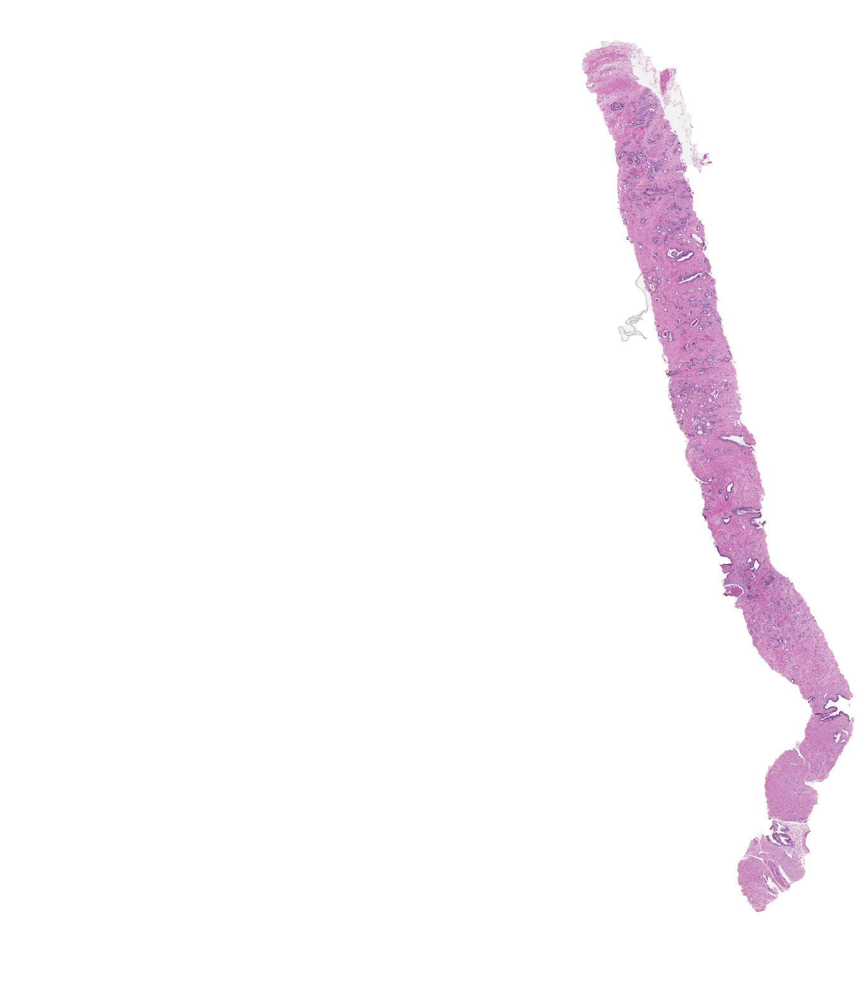

Gleason Score:  5+3 im_ID:  aae503ac1b8aa0f17fc7ebff97c047df
Biopsy level 0 dimensions: (33024, 23552, 3)
Biopsy level 0 memory size: 2225.2mb


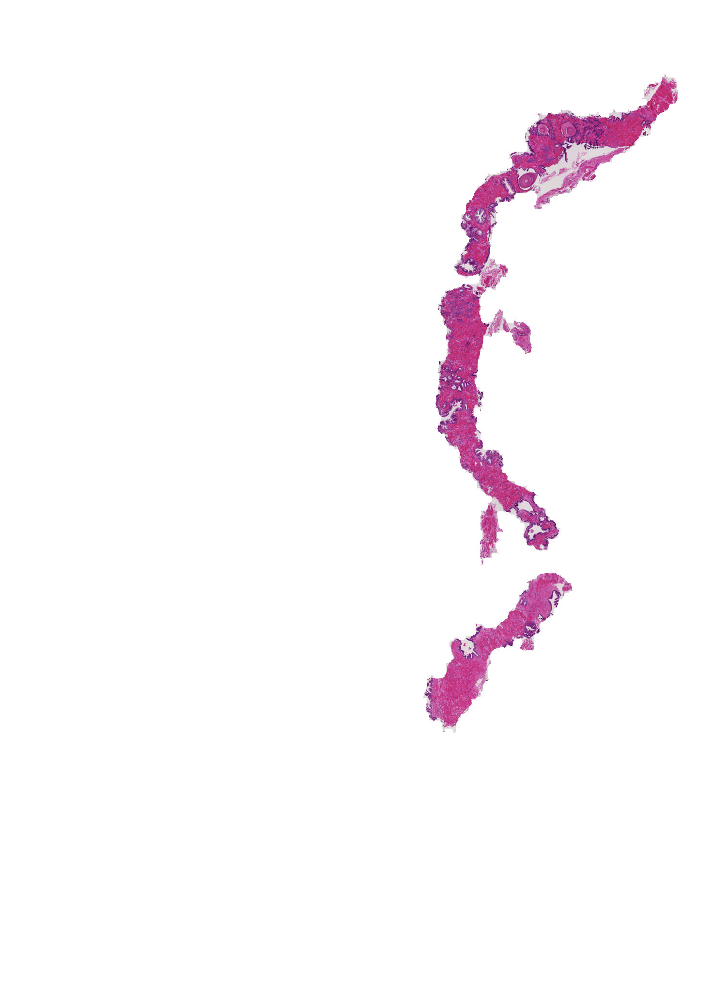

Gleason Score:  5+4 im_ID:  d8442dd9a38b2f244a020c1b39107751
Biopsy level 0 dimensions: (28416, 15360, 3)
Biopsy level 0 memory size: 1248.8mb


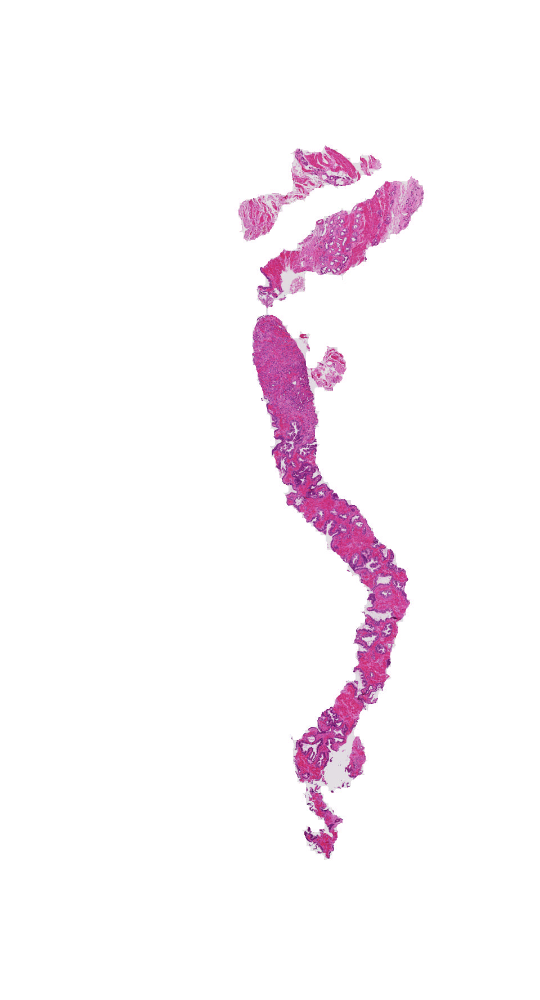

Gleason Score:  5+5 im_ID:  f28915d34c10051b4a91d30d2cbca62c
Biopsy level 0 dimensions: (18189, 37848, 3)
Biopsy level 0 memory size: 1969.6mb


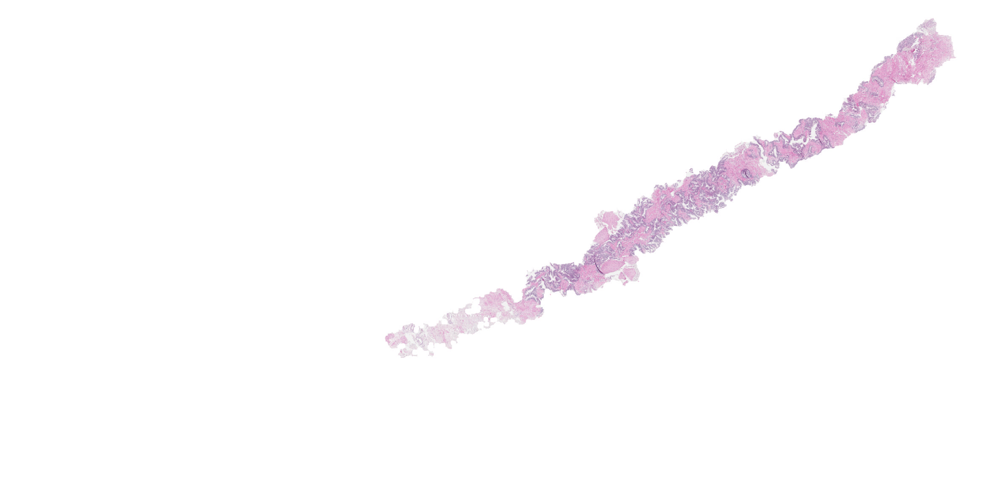

Gleason Score:  0+0 im_ID:  45abd719007c004e8b172a18bac7d2d1
Biopsy level 0 dimensions: (25600, 28672, 3)
Biopsy level 0 memory size: 2100.0mb


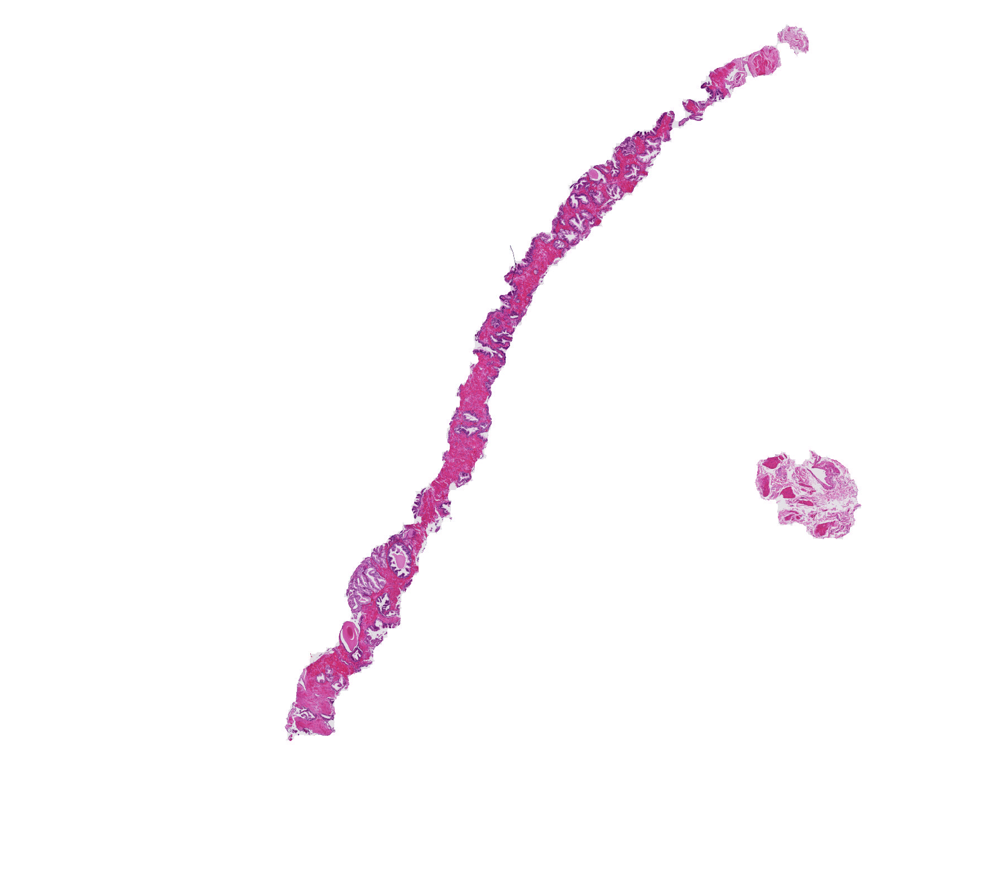

In [16]:
# Sample Images from Karolinska Institute
large_display(kar_im_ID)

**Let us see the distribution of the image sizes and whether that is due to the actual size of the biopsy tissue or the blank spaces**

In [17]:
def crop_white(image: np.ndarray, value: int = 255) -> np.ndarray:
    ''' Crop empty regions in the image'''
    assert image.shape[2] == 3
    assert image.dtype == np.uint8
    
    ys, = (image.min((1, 2)) < value).nonzero()
    xs, = (image.min(0).min(1) < value).nonzero()
    if len(xs) == 0 or len(ys) == 0:
        print("Image is empty")
        return[0,0,0,0]
    return [ys.min(),ys.max(), xs.min(),xs.max()]   #return the bbox

In [18]:
'''Update the laabels dataframe with image sizes '''

cropped_bbox=[]
train_dims=train_labels.copy()

tic = time.perf_counter()
im_IDs=train_labels.reset_index().image_id

with tqdm(total=len(im_IDs)) as pbar:
    for i in im_IDs:
        pbar.update(1)

        img_path=os.path.join(data_dir, i+'.tiff')
        whole,width,height = sk_img(img_path, level=2,verbose=False)

        whole_array=np.asarray(whole)
        [ymin,ymax,xmin,xmax]= crop_white(whole_array)

        cropped_bbox.append([xmin,xmax,ymin,ymax])
        #print(i,[width, height],[xmax-xmin,ymax-ymin])

        train_dims.loc[i, 'width']   = width
        train_dims.loc[i, 'height']  = height
        train_dims.loc[i, 'cropped_width']  = xmax-xmin
        train_dims.loc[i, 'cropped_height'] = ymax-ymin

    toc = time.perf_counter()
print(f"Operation took {(toc - tic)//60:0.0f} minutes {(toc - tic)%60:0.4f} seconds")

 21%|██        | 2229/10616 [21:18<1:33:20,  1.50it/s]

Image is empty


100%|██████████| 10616/10616 [1:49:46<00:00,  1.61it/s] 

Operation took 109 minutes 46.0638 seconds


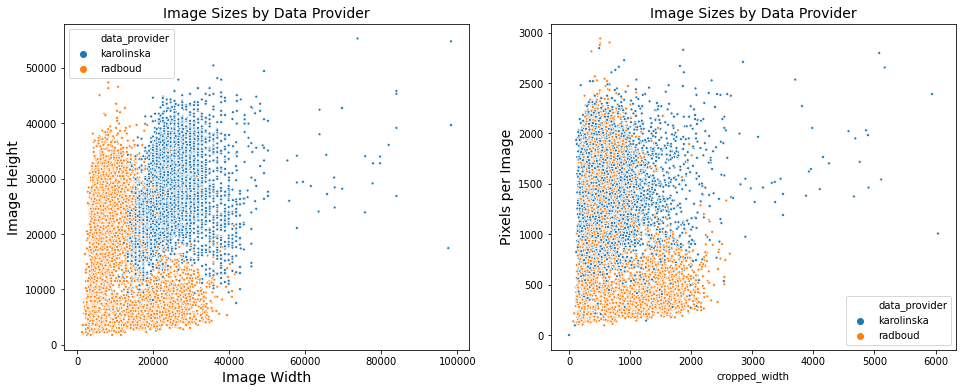

In [19]:
fig, [ax1, ax2] = plt.subplots(nrows=1, ncols=2, figsize=(16, 6))
sb.scatterplot(data=train_dims, x='width', y='height', marker='.',hue='data_provider', ax=ax1)
ax1.set_title("Image Sizes by Data Provider", fontsize=14)
ax1.set_xlabel("Image Width", fontsize=14)
ax1.set_ylabel("Image Height", fontsize=14)

sb.scatterplot(data=train_dims, x='cropped_width', y='cropped_height', marker='.',hue='data_provider', ax=ax2)
ax2.set_title("Image Sizes by Data Provider", fontsize=14)
ax2.set_ylabel("Pixels per Image", fontsize=14)
plt.show()

The differences between image sizes can be explained with the empty spaces in the Karolinska images